# 이미지 학습을 통한 도형 인식 연습

In [222]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras import optimizers
from keras.models import Model
from keras.layers import Dense, Activation, Flatten, Conv2D, MaxPooling2D
from keras.layers import BatchNormalization, Dropout

## trainset 구성

In [223]:
TRAIN_DIR = './hard_handwriting_shape/train/'
train_folder_list = np.array(os.listdir(TRAIN_DIR))

X_train = np.zeros((15*3, 24,24))
y_train = np.zeros(15*3)
  
for index in range(len(train_folder_list)):
    path = os.path.join(TRAIN_DIR, train_folder_list[index])
    path = path + '/'
    img_list = os.listdir(path)
    i = 0
    for img in img_list:
        
        img_path = os.path.join(path, img)
        img = cv2.imread(img_path, 0)
        if index == 0:
            X_train[i,:,:] = img
            y_train[i] = index
        elif index == 1:
            X_train[i+15,:,:] = img
            y_train[i+15] = index
        else:
            X_train[i+30,:,:] = img
            y_train[i+30] = index
        i += 1


##  testset 구성

In [224]:
test_DIR = './hard_handwriting_shape/test/'
test_folder_list = np.array(os.listdir(test_DIR))

X_test = np.zeros((5*3, 24,24))
y_test = np.zeros(5*3)
  
for index in range(len(test_folder_list)):
    path = os.path.join(test_DIR, test_folder_list[index])
    path = path + '/'
    img_list = os.listdir(path)
    i = 0
    for img in img_list:
        
        img_path = os.path.join(path, img)
        img = cv2.imread(img_path, 0)
        if index == 0:
            X_test[i,:,:] = img
            y_test[i] = index
        elif index == 1:
            X_test[i+5,:,:] = img
            y_test[i+5] = index
        else:
            X_test[i+10,:,:] = img
            y_test[i+10] = index
        i += 1

In [225]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(45, 24, 24) (15, 24, 24) (45, 3) (15, 3)


In [226]:
X_train =  X_train.reshape(-1, 24,24,1)
X_test =  X_test.reshape(-1, 24,24,1)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(45, 24, 24, 1)
(15, 24, 24, 1)
(45, 3)
(15, 3)


## 모델 구성

In [227]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), input_shape=(24, 24, 1)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())

model.add(Dense(128))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(64))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(3, activation='softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])

model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 22, 22, 32)        320       
_________________________________________________________________
batch_normalization_19 (Batc (None, 22, 22, 32)        128       
_________________________________________________________________
activation_20 (Activation)   (None, 22, 22, 32)        0         
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 9, 9, 64)          18496     
_________________________________________________________________
batch_normalization_20 (Batc (None, 9, 9, 64)          256       
_________________________________________________________________
activation_21 (Activation)   (None, 9, 9, 64)         

## 모델 학습 및 결과 출력

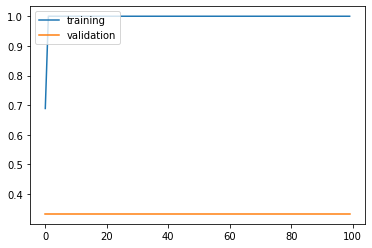

15/15 [==============================] - 0s 329us/step
[2.3524365425109863, 0.3333333432674408]


In [228]:
history = model.fit(X_train, y_train, batch_size=15, epochs=100,
                    validation_data=(X_test, y_test), verbose=0)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['training', 'validation'], loc = 'upper left')
plt.show()
results = model.evaluate(X_test, y_test)
print(results)

## 모델 가중치 및 필터 확인

In [229]:
w = model.layers[0].get_weights()
#가중치 확인
print(w[0].shape)
print(w[1].shape)
#필터 확인
print(w[0][:,:,0,0])
print(w[0][:,:,0,1])

(3, 3, 1, 32)
(32,)
[[ 0.08834005 -0.11209744  0.07872706]
 [-0.09349058 -0.01015254 -0.00738598]
 [ 0.07983309 -0.01877961  0.04348015]]
[[ 0.03666363  0.02033894 -0.09908284]
 [-0.03697098 -0.08298297 -0.06460878]
 [ 0.05204549 -0.11441649  0.04888776]]


In [234]:
for l in model.layers:
    print(l.name)
    print(l.trainable)

conv2d_13
True
batch_normalization_19
True
activation_20
True
max_pooling2d_11
True
conv2d_14
True
batch_normalization_20
True
activation_21
True
max_pooling2d_12
True
flatten_7
True
dense_17
True
batch_normalization_21
True
activation_22
True
dense_18
True
batch_normalization_22
True
activation_23
True
dense_19
True


In [230]:
model.layers[0].output

<tf.Tensor 'conv2d_13/BiasAdd:0' shape=(?, 22, 22, 32) dtype=float32>

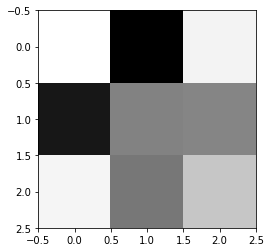

In [231]:
plt.imshow(w[0][:,:,0,0], cmap="gray")

## 테스트 이미지와 필터 적용 확인

(15, 22, 22, 32)


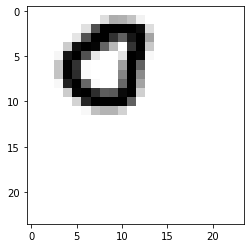

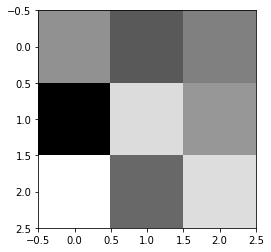

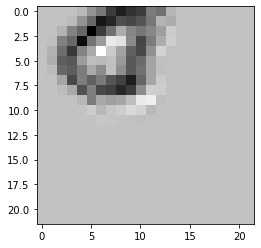

In [232]:
my_layer_model = Model(inputs=model.input, outputs=model.layers[0].output)
output = my_layer_model.predict(X_test)

print(output.shape)


def check_img_filter(iImage, iFilter):
    # 원본이미지(1번 이미지)
    plt.imshow(X_test[iImg, :, :, 0], cmap='gray')
    plt.show()
    # 필터
    w = model.layers[0].get_weights()
    w = w[0]
    f = w[:, :, 0, iFilter]
    plt.imshow(f, cmap='gray')
    plt.show()
    # 출력
    # 1번 테스트 이미지(index상 2번)에 5번 필터적용한 이미지
    plt.imshow(output[iImg, :, :, iFilter], cmap='gray')
    plt.show()


check_img_filter(1, 5)

## layer 선택함수 get_layer()

In [235]:
my_layer_model = Model(
    inputs=model.input, outputs=model.get_layer('flatten_7').output)
output = my_layer_model.predict(X_test)
print(output.shape)   #영상에 대해서 1차원 출력값

(15, 1024)


In [237]:
my_layer_model = Model(
    inputs=model.input, outputs=model.get_layer('dense_19').output) #최종 layer선택시 모델 결과값 출력
output = my_layer_model.predict(X_test)
print(output.shape)
print(output) #첫번째 input 에 대한 최종 출력값

P = np.argmax(output, axis=1)#예측값 출력
T = np.argmax(y_test, axis=1)
print(P == T) #실제값과 비교하여 출력
print(sum(P == T)*1) #맞춘 갯수
print(sum(P == T)*1/len(P)) # 정답률

(15, 3)
[[0.06809623 0.12374833 0.8081554 ]
 [0.27359697 0.19266702 0.533736  ]
 [0.0155324  0.02723959 0.95722795]
 [0.00892209 0.00103034 0.9900476 ]
 [0.00523381 0.0014735  0.9932927 ]
 [0.36191282 0.0861776  0.55190957]
 [0.05637201 0.03031474 0.91331327]
 [0.01900792 0.01961465 0.9613774 ]
 [0.11149686 0.21185172 0.67665136]
 [0.0118564  0.00406619 0.98407733]
 [0.0394082  0.03559876 0.924993  ]
 [0.00167891 0.00255349 0.9957676 ]
 [0.02585803 0.01274936 0.9613926 ]
 [0.02336959 0.02671664 0.9499138 ]
 [0.05009916 0.00636458 0.9435362 ]]
[False False False False False False False False False False  True  True
  True  True  True]
5
0.3333333333333333


# Data Augmentation

In [238]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import keras
import tensorflow as tf
import numpy as np
from numpy  import expand_dims
import cv2
from matplotlib import pyplot as plt
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
np.random.seed(15)

## data augmentation
dataset이 너무 작은 경우 overfitting 발생
keras에서는 data augmentation으로 해결
* translations
* Rotations
* changes in scale
* Shearing
* Horizontal (and in some cases, vertical) flips

In [239]:
img = tf.keras.preprocessing.image.load_img('chloe.png')  # 이미지 객체임
data = tf.keras.preprocessing.image.img_to_array(img)   # data 만 추출
sample = expand_dims(data,0)  
print(sample.shape)

(1, 400, 400, 3)


In [240]:
data = cv2.imread('chloe.png') # opencv 사용해 이미지 loaidng
data = cv2.cvtColor(data, cv2.COLOR_BGR2RGB)
sample = expand_dims(data,0)
print(sample.shape)

(1, 400, 400, 3)


In [241]:
generator = tf.keras.preprocessing.image.ImageDataGenerator(    
    width_shift_range = 0.2) 
obj = generator.flow(sample, batch_size=1)

(1, 400, 400, 3)
(400, 400, 3)


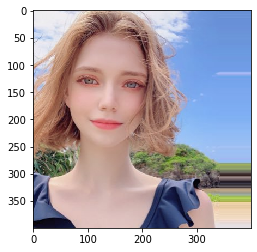

In [242]:
#할때마다 다른 이미지 나온다.
image = obj.next()
print(image.shape)  # 
print(image[0].shape)
#plt.imshow(image[0].astype('uint8') )  #  plt로 할때는 0~1사이로  혹은 타입을 uint8로 
plt.imshow(image[0]/255)  #  plt로 할때는 0~1사이로  혹은 타입을 uint8로 

In [243]:
generator = tf.keras.preprocessing.image.ImageDataGenerator(    
    width_shift_range = 0.2, rescale=1./255)   # rescale 해주면 정규화하고, imshow할때 type변한 필유없다.
obj = generator.flow(sample, batch_size=1)

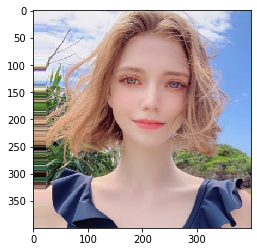

In [244]:
image = obj.next()
plt.imshow(image[0])

## 평행이동

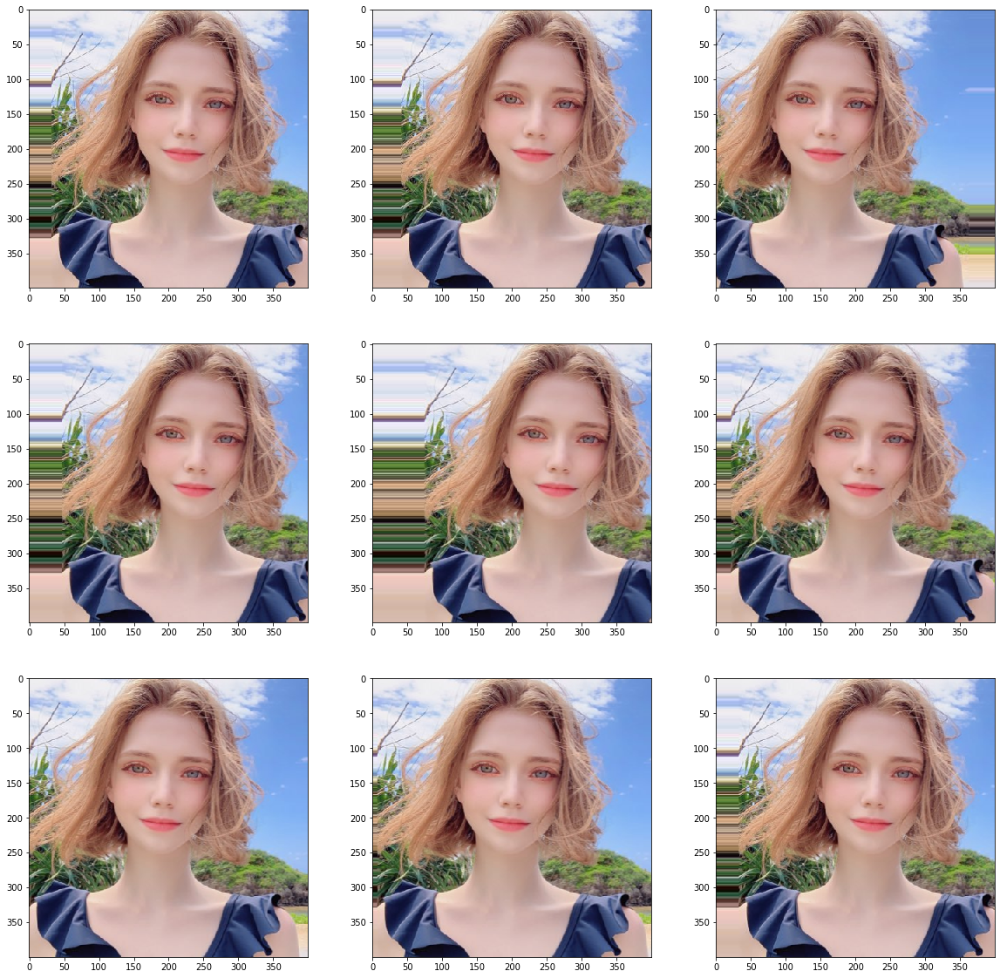

In [245]:
fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])   

## 회전

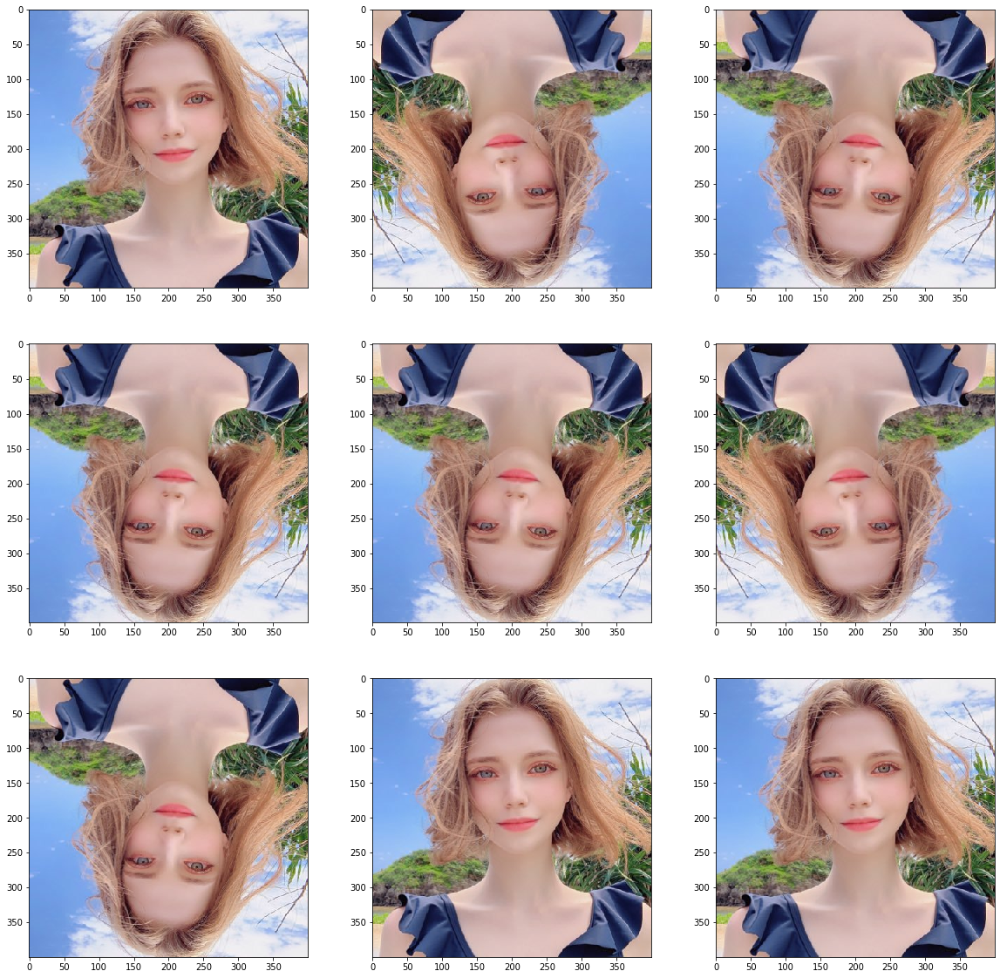

In [246]:
generator = tf.keras.preprocessing.image.ImageDataGenerator( 
    horizontal_flip = True, vertical_flip = True,
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])   

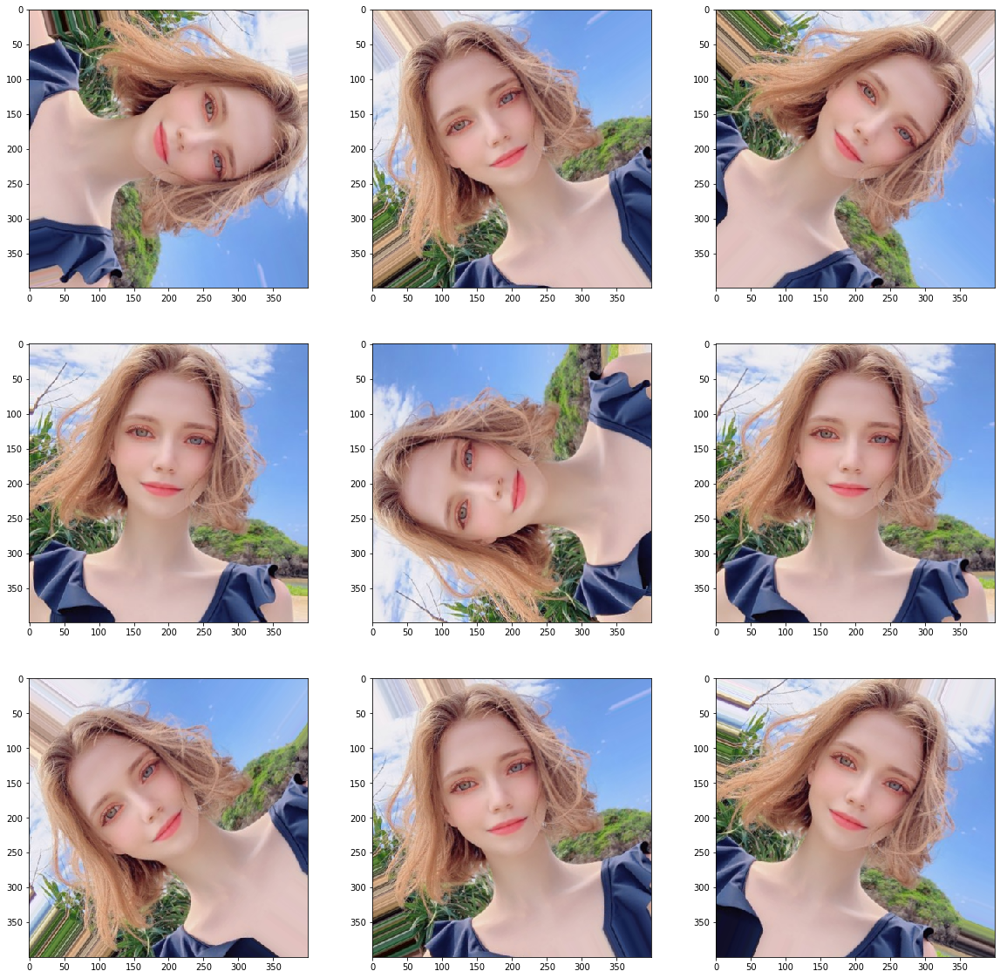

In [248]:
generator = tf.keras.preprocessing.image.ImageDataGenerator( 
    rotation_range=90,
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])

## 명암 조절

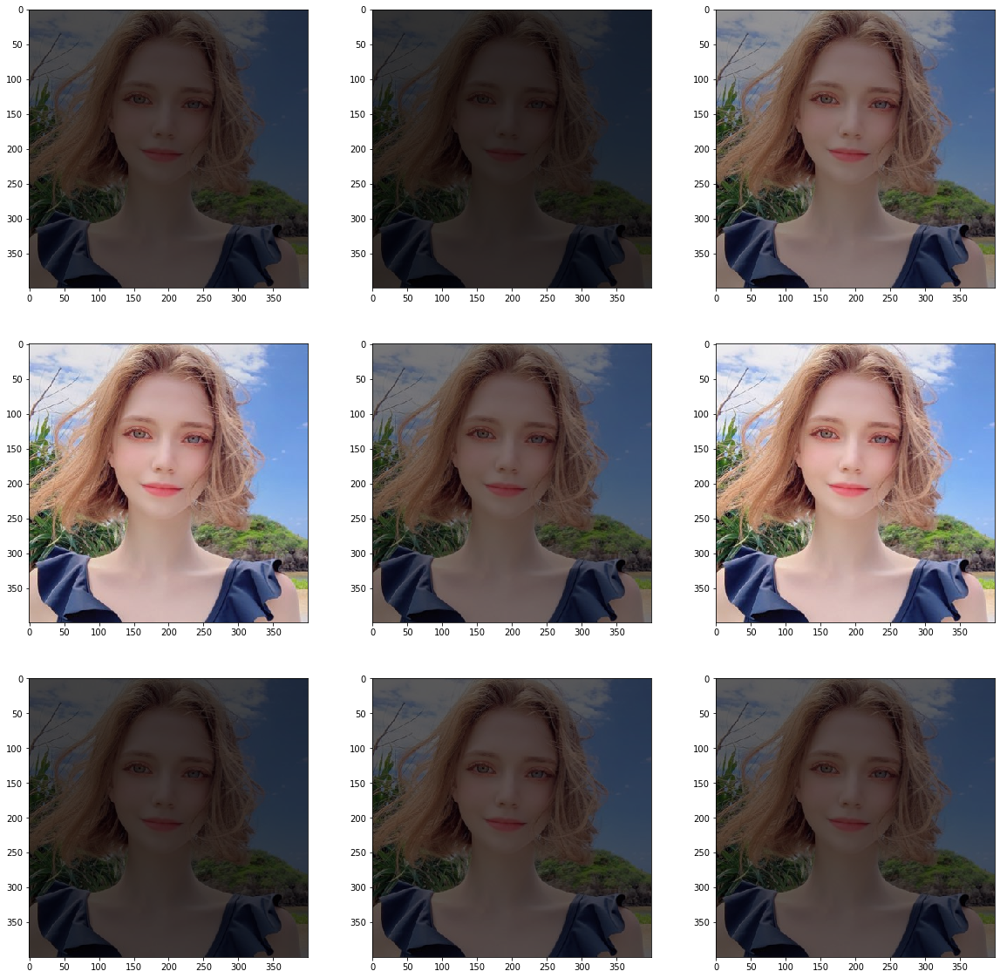

In [249]:
generator = tf.keras.preprocessing.image.ImageDataGenerator( 
    brightness_range=[0.2, 1.0],       
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])   

## 확대, 축소

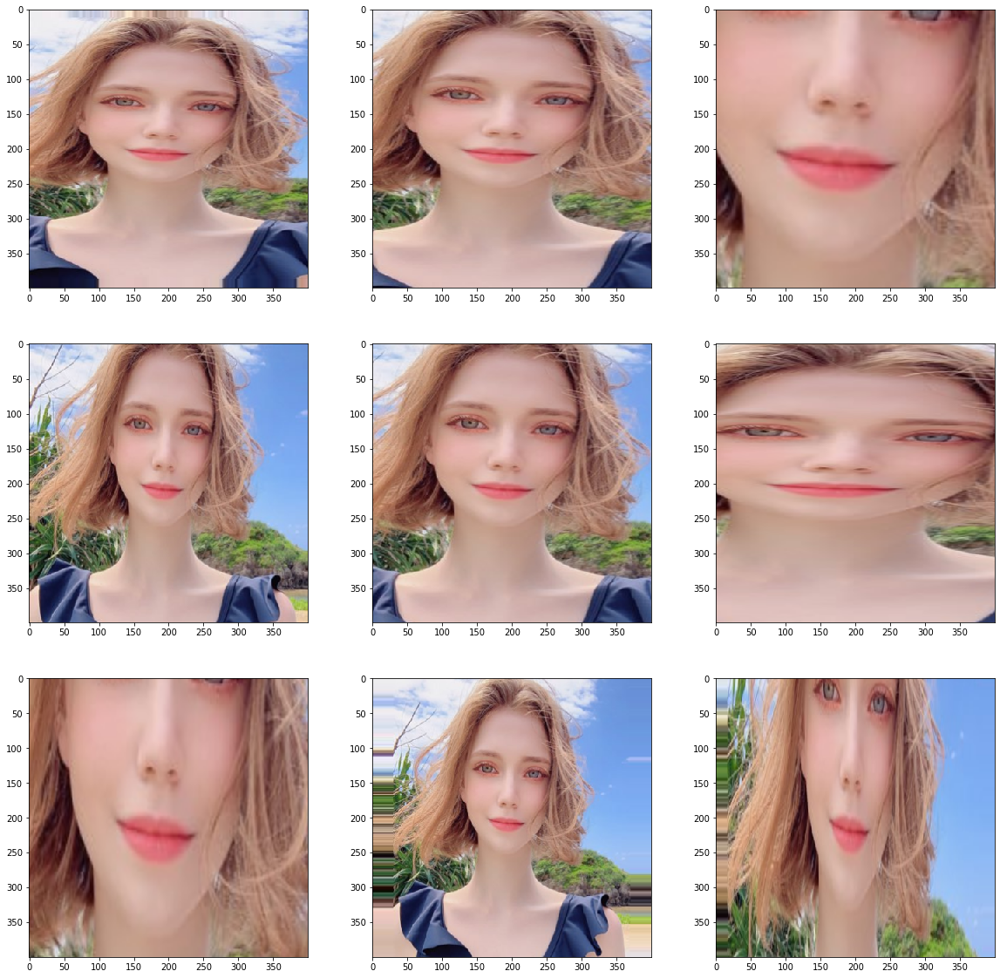

In [250]:
generator = tf.keras.preprocessing.image.ImageDataGenerator( 
    zoom_range=[0.2, 1.2],   
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])

## 모든 사항 적용

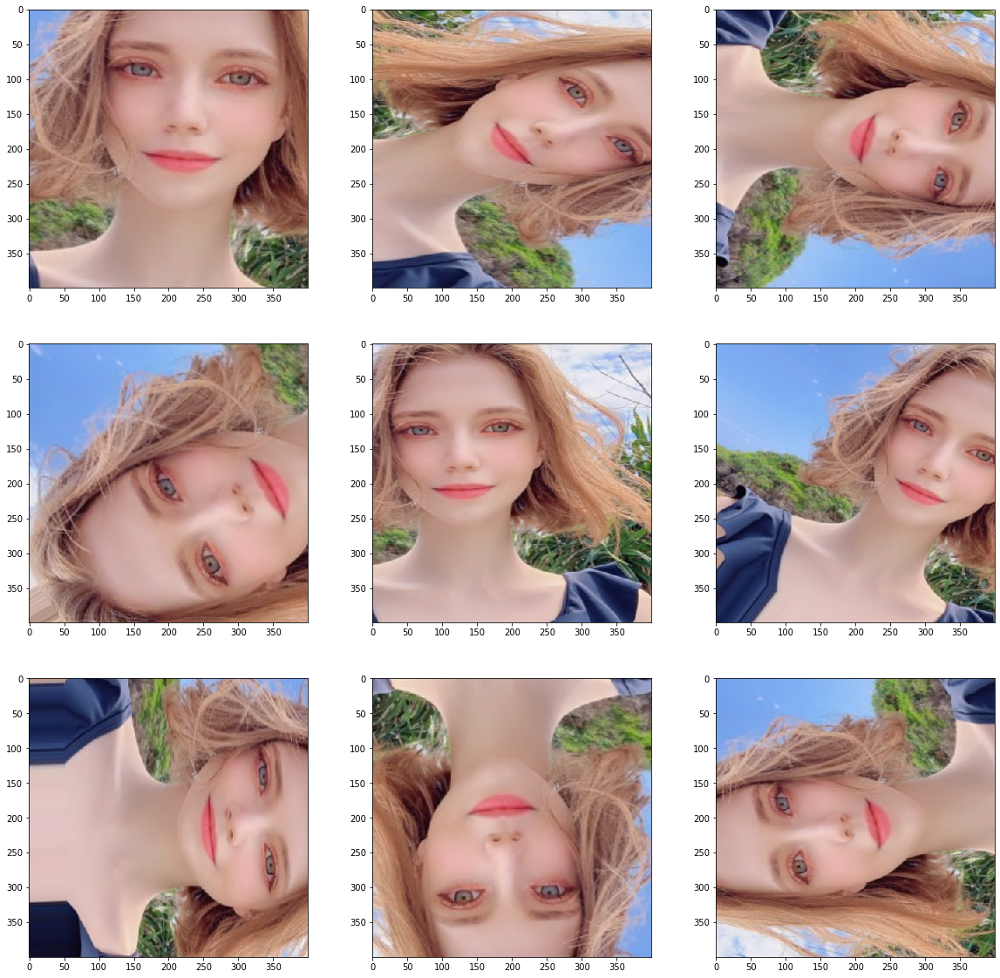

In [251]:
generator = tf.keras.preprocessing.image.ImageDataGenerator( 
    width_shift_range = 0.2,
    zoom_range=[0.5, 1.0],   
    horizontal_flip = True, vertical_flip = True,
    rotation_range=90,
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])   

In [252]:
# 파일로 저장하기
obj = generator.flow(sample, batch_size=1, save_to_dir='tmp',  # 폴더는 생성되어 있어야 함
    save_prefix="image", save_format="jpg")    

for i in range(0, 5):
    obj.next()    

## 파일 복제 후 저장
경로설정, 파일형식 지정 가능

In [253]:
obj = generator.flow_from_directory(
    'hard_handwriting_shape',
    target_size = (150, 150),   # 읽어드릴 이미지, 이미지 크기를 맞춰야 하기 때문에 생략시 256x256
    batch_size = 4,   # 8개 이미지 중에서 최대4개 만들어냄
    class_mode = 'binary',
    save_prefix="image", save_format="jpg",save_to_dir='tmp')

iterations = 2

for i, (img, label) in enumerate(obj):
    n_img = len(label)    # 폴더에 있는 이미지 갯수 만큼 리턴한다.
    print(label)
    print(img.shape)
    if i is iterations - 1:
        break

Found 106 images belonging to 4 classes.
[1. 1. 1. 3.]
(4, 150, 150, 3)
[3. 3. 3. 2.]
(4, 150, 150, 3)


# 도형

In [254]:
np.random.seed(5)


# 데이터셋 불러오기
data_aug_gen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range=15,
                                  width_shift_range=0.1,
                                  height_shift_range=0.1,
                                  shear_range=0.5,
                                  zoom_range=[0.8, 2.0],
                                  horizontal_flip=True,
                                  vertical_flip=True,
                                  fill_mode='nearest')
                                   
img = load_img('hard_handwriting_shape/train/triangle/triangle001.png')
x = img_to_array(img)
x = x.reshape((1,) + x.shape)
i = 0

# 이 for는 무한으로 반복되기 때문에 우리가 원하는 반복횟수를 지정하여, 지정된 반복횟수가 되면 빠져나오도록 해야합니다.
for batch in data_aug_gen.flow(x, batch_size=1, save_to_dir='hard_handwriting_shape/tmp', save_prefix='tri', save_format='png'):
    i += 1
    if i > 30: 
        break

In [255]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=10,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.7,
                                   zoom_range=[0.9, 2.2],
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
        'hard_handwriting_shape/train',
        target_size=(24, 24),
        batch_size=3,
        class_mode='categorical')

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
        'hard_handwriting_shape/test',
        target_size=(24, 24),    
        batch_size=3,
        class_mode='categorical', shuffle=False)

Found 45 images belonging to 3 classes.
Found 15 images belonging to 3 classes.


In [256]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

# 모델 엮기
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [257]:
# 모델 학습시키기
model.fit_generator(
        train_generator,
        steps_per_epoch=15 * 100,
        epochs=10, #200
        validation_data=test_generator,
        validation_steps=5)

Epoch 1/10
1500/1500 [==============================] - 29s 20ms/step - loss: 0.2089 - accuracy: 0.9184 - val_loss: 0.0054 - val_accuracy: 0.7333
Epoch 2/10
1500/1500 [==============================] - 27s 18ms/step - loss: 0.0333 - accuracy: 0.9909 - val_loss: 3.7301e-04 - val_accuracy: 0.8000
Epoch 3/10
1500/1500 [==============================] - 28s 18ms/step - loss: 0.0331 - accuracy: 0.9902 - val_loss: 1.6661e-04 - val_accuracy: 0.8000
Epoch 4/10
1500/1500 [==============================] - 29s 20ms/step - loss: 0.0175 - accuracy: 0.9938 - val_loss: 3.0597e-06 - val_accuracy: 0.7333
Epoch 5/10
1500/1500 [==============================] - 29s 20ms/step - loss: 0.0233 - accuracy: 0.9920 - val_loss: 5.8015e-06 - val_accuracy: 0.7333
Epoch 6/10
1500/1500 [==============================] - 28s 19ms/step - loss: 0.0161 - accuracy: 0.9956 - val_loss: 3.8147e-06 - val_accuracy: 0.7333
Epoch 7/10
1500/1500 [==============================] - 29s 19ms/step - loss: 0.0114 - accuracy: 0.9967 

In [258]:
# 모델 예측하기
print("-- Predict --")
output = model.predict_generator( test_generator,  steps = 5)    # batch 사이즈가 3 , 15개가 생성됨
print(output)

T = test_generator.classes
print(T)
p = np.argmax(output, axis=1)
print(p)

sum((T == p)*1) / len(T)

-- Predict --
[[4.48979641e-04 9.99549329e-01 1.63556808e-06]
 [1.64857752e-07 1.44753983e-06 9.99998331e-01]
 [9.99998808e-01 3.43850526e-09 1.17422223e-06]
 [1.00000000e+00 7.22838803e-11 1.41505040e-13]
 [9.99995112e-01 1.86245046e-07 4.68140752e-06]
 [1.68901455e-11 1.00000000e+00 3.03025161e-09]
 [3.76714651e-14 7.19654918e-06 9.99992847e-01]
 [5.27239606e-11 9.99995828e-01 4.13798261e-06]
 [1.13116724e-13 1.00000000e+00 8.59858851e-11]
 [9.60956991e-01 3.90073694e-02 3.56794226e-05]
 [2.09621296e-11 4.90690582e-06 9.99995112e-01]
 [1.57484487e-19 4.25736683e-14 1.00000000e+00]
 [3.07918867e-07 8.96657948e-05 9.99909997e-01]
 [1.19868579e-13 2.01374553e-16 1.00000000e+00]
 [3.42652968e-23 9.57491007e-18 1.00000000e+00]]
[0 0 0 0 0 1 1 1 1 1 2 2 2 2 2]
[1 2 0 0 0 1 2 1 1 0 2 2 2 2 2]


0.7333333333333333

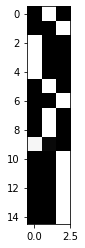

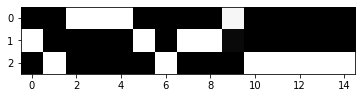

In [259]:
plt.imshow(output, cmap='gray')
plt.show()
plt.imshow(output.T, cmap='gray')
plt.show()

In [260]:
# 모델 평가하기
scores = model.evaluate_generator( test_generator, steps = 5)
print(scores[1])

0.7333333492279053


In [261]:
labels = ['C', 'R', 'T']

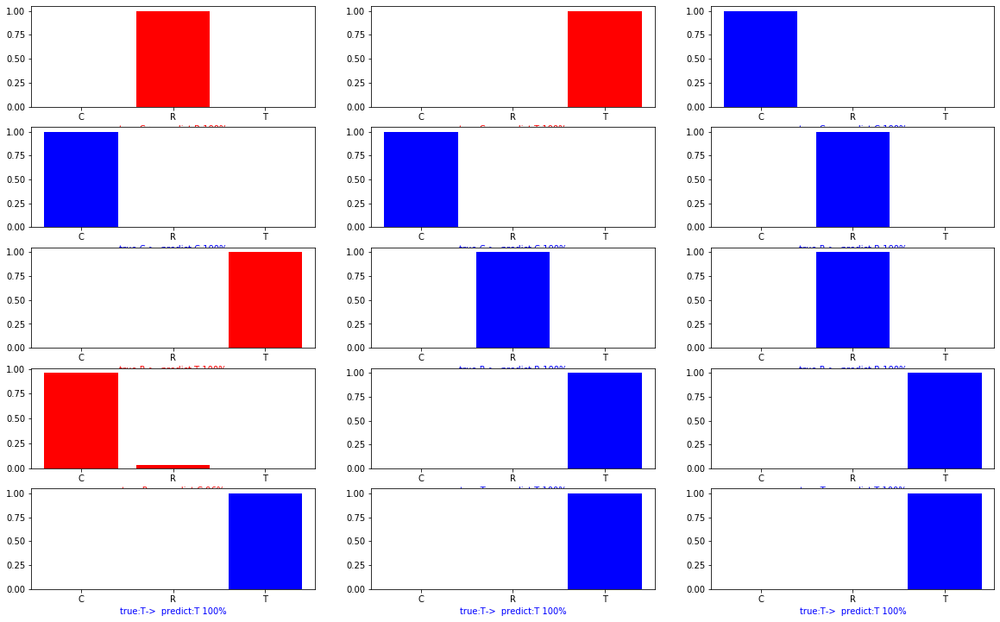

In [262]:
idx = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
plt.figure(figsize=(20, 15))

cc = 3
rr = int(len(idx) / cc)+1

for k in range(len(idx)):
    i = idx[k]
    c = "blue" if p[i] == T[i] else "red"
    plt.subplot(rr, cc, k+1)
    plt.bar(labels, output[i], color=c)
    plt.xlabel("true:{}->  predict:{} {:2.0f}%".format(
        labels[int(T[i])], labels[p[i]],  100*np.max(output[i], axis=0)),  color=c)

In [263]:
test_generator = test_datagen.flow_from_directory(
    'hard_handwriting_shape/test', target_size=(24, 24), batch_size=15, class_mode='binary', shuffle=False)
a = test_generator.next()
print(a[0].shape)
print(a[1].shape)

Found 15 images belonging to 3 classes.
(15, 24, 24, 3)
(15,)


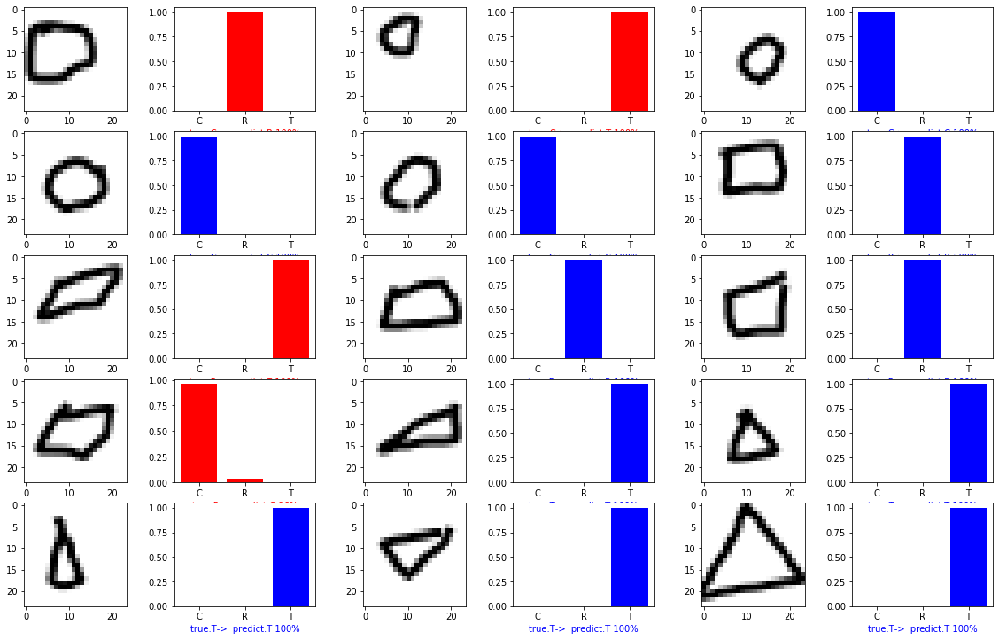

In [265]:
plt.figure(figsize=(20, 15))

cc = 3
rr = int(len(idx) / cc)+1

for k in range(len(idx)):
    i = idx[k]
    c = "blue" if p[i] == T[i] else "red"
    plt.subplot(rr, cc*2, k*2+1)
    plt.imshow(X_test[i, :, :, 0], cmap="gray")
    plt.subplot(rr, cc*2, k*2+2)
    plt.bar(labels, output[i], color=c)
    plt.xlabel("true:{}->  predict:{} {:2.0f}%".format(
        labels[int(T[i])], labels[p[i]],  100*np.max(output[i], axis=0)),  color=c)

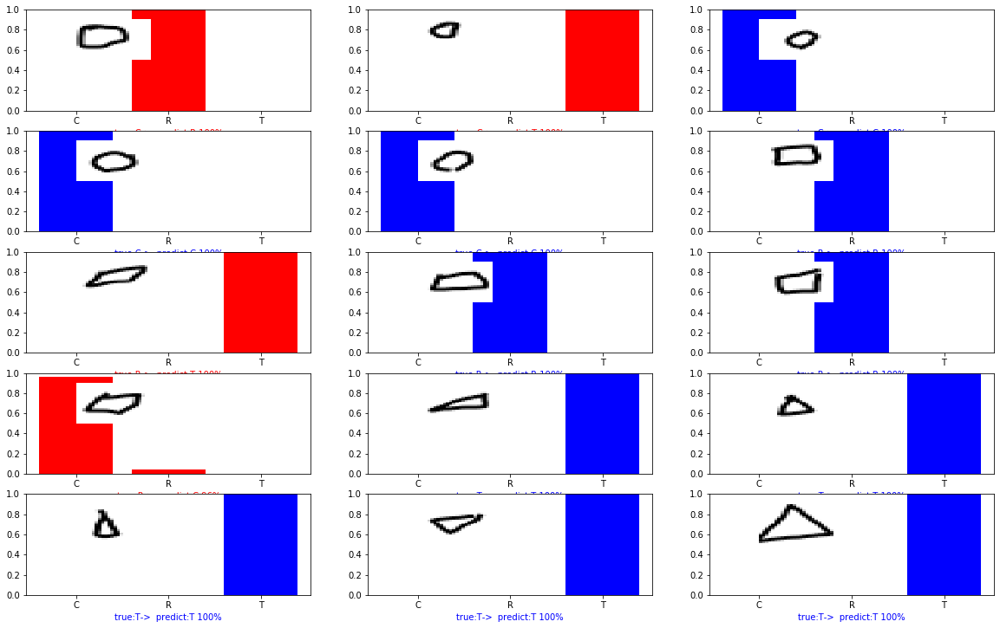

In [266]:
plt.figure(figsize=(20, 15))

cc = 3
rr = int(len(idx) / cc)+1

for k in range(len(idx)):
    i = idx[k]
    c = "blue" if p[i] == T[i] else "red"
    plt.subplot(rr, cc, k+1)
    #  left and right limits, and the bottom and top limits.
    plt.imshow(X_test[i, :, :, 0], extent=[0, 0.8, 0.5, 0.9],
               aspect='auto', zorder=10, cmap="gray")
    plt.ylim(0.0, 1.0)
    plt.bar(labels, output[i], color=c)
    plt.xlabel("true:{}->  predict:{} {:2.0f}%".format(
        labels[int(T[i])], labels[p[i]],  100*np.max(output[i], axis=0)),  color=c)

plt.savefig('fig1.png')